In [1]:
from PIL import Image
import h5py
import anubisPlotUtils as anPlot
import json
import numpy as np
import os
import hist as hi
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as colors
matplotlib.use('TkAgg')  # or 'Qt5Agg', 'GTK3Agg', etc.
import mplhep as hep
hep.style.use([hep.style.ATLAS])
import sys
import ANUBIS_triggered_functions as ANT
import pandas as pd
import matplotlib.backends.backend_pdf
from matplotlib.ticker import MultipleLocator
import plotly
import plotly.graph_objs as go
import plotly.express as px

import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import norm


%matplotlib inline

In [2]:
current_directory=  os.path.dirname(os.getcwd())

data = ANT.importDatafile(current_directory+"\\ProAnubisData\\ATLAS LUMINOSITY\\proAnubis_240403_0227.h5")

In [3]:
data_ATLAS = [sublist[:94230] for sublist in data]
etaHits, phiHits = ANT.divideHitCountsByRPC_Timed(data_ATLAS)

In [4]:
#Time_window for coincidence set at 15 ns.
#Temporal Clustering
coincident_hits_ATLAS = ANT.FindCoincidentHits(etaHits,phiHits,15)

#Spatial Clustering
coincident_hits_ATLAS_clustered = ANT.cluster(coincident_hits_ATLAS)

0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0

Need to correct dT extraction. Not implemented correctly at the moment.

In [5]:
def extract_coords_timed_Chi2(event,max_cluster_size):

    #This function converts spatially clusters in RPCs into x and y coordinates (z given by RPC number)
    # event = ['Event x',TIMEBIN, [[[RPC1_PHI_CLUSTERS],[RPC1_ETA_CLUSTERS]],[[...],[...]],...]

    #Extract x and y coords of cluster in event
    distance_per_phi_channel = 2.7625 #cm
    distance_per_eta_channel = 2.9844 #cm
    
    coords = []

    for RPC in range(6):
        
        x_clusters = [x for x in event[2][RPC][0] if len(x)<=max_cluster_size] #phi direction
        y_clusters = [y for y in event[2][RPC][1] if len(y)<=max_cluster_size] #eta direction

        #Finding size of largest cluster, consider coordinates bad if largest cluster is larger than 6.
        x_clusters_lengths = [len(x) for x in event[2][RPC][0]]
        y_clusters_lengths = [len(y) for y in event[2][RPC][1]]

        max_length = max(max(x_clusters_lengths, default=0), max(y_clusters_lengths, default=0))

        x_coords = []
        y_coords = []
        x_times =  []

        for x_cluster in x_clusters:
           #x_cluster = [[RPC,CHANNEL,TIME,'phi'],...]
            phi_channels = [x[1] for x in x_cluster]
            phi_times = [t[2] for t in x_cluster]

            #Convert the channel number into a measurement along the RPC.
            x_values = [(phi_channel+0.5)*distance_per_phi_channel for phi_channel in phi_channels]

            #Variance in x coord.
            x_var = (len(phi_channels)*distance_per_phi_channel)**2/12

            x_coords.append([np.mean(x_values),x_var,np.average(phi_times)])

        for y_cluster in y_clusters:
            #y_cluster = [[RPC,CHANNEL,TIME,'eta'],...]
            eta_channels_corrected = [31-y[1] for y in y_cluster] #corrected for labelling from 0 to 31.
            y_values = [(channel_num+0.5)*distance_per_eta_channel for channel_num in eta_channels_corrected]
            
            y_var = (len(y_cluster)*distance_per_eta_channel)**2 /12
            y_coords.append([np.mean(y_values),y_var])

        if x_coords and y_coords and max_length<6:

            coords.append([x_coords, y_coords,x_times])

        else:
            coords.append([[],[],"N"])

    #[x_coords] = [[x,err_x,x_time],...]
    
    #RPC_coords = [x_coords,y_coords,x_times]

    #coords = [[RPC1_coords],[RPC2_coords],[RPC3_coords],...]
    return coords

def extract_DT_Chi2(coords):

    #coords = [[[x0,var,time],[y0,var],z0],[[x1,var,time],[y1,var],z1],...,[[x5,var,time],[y5,var],z5]]

    times = [[RPC,x[0][2]] for RPC, x in enumerate(coords) if isinstance(x[2], (float, int))]

    #Should already be sorted, but just in case.
    #Sort times by RPC, with RPC at lowest height at first entry.

    if len(times) > 1:

        times_sorted = sorted(times, key=lambda x: x[0])

        #print(times_sorted)

        dT = times_sorted[-1][1]-times_sorted[0][1]
        #if dT>0 this implies the particles hit the higher RPC after the lower one, so the particle is travelling upwards here.
        #Vice-versa for dT < 0 

        return dT
    else:
        pass

def fit_event_chi2(coordinates_with_error):
    #Coordinates = [[[x0,var,time],[y0,var],z0],[[x1,var,time],[y1,var],z1],...,[[x5,var,time],[y5,var],z5]]
    #Z coordinate given by height of relevant RPC.
    #Using SVD

    # Calculate dT for event, in ns
    dT = extract_DT_Chi2(coordinates_with_error)
    
    coordinates = []

    for coords in coordinates_with_error:
        coordinates.append([coords[0][0],coords[1][0],coords[2]])

    centroid = np.mean(coordinates, axis=0)
    subtracted = coordinates-centroid

    # performing SVD
    _, _, V = np.linalg.svd(subtracted)
    
    # find the direction vector (which is the right singular vector corresponding to the largest singular value)
    direction = V[0, :]

    # A line is defined by the average and its direction
    p0 = centroid
    d = direction

    #Work out Chi2. Minimise this to find best fit (from possible combos)

    Chi2 = 0

    for point in coordinates_with_error:
        
        z = point[2]
        x = point[0][0]
        y = point[1][0]
        x_var = point[0][1]
        y_var = point[1][1]

        z_0 = centroid[2]

        # t = (z-z_0)/d_z

        t = (z-z_0)/d[2]

        # Find expected (x,y) coordinates at that height.

        x_traj = centroid[0] + t*d[0]
        y_traj = centroid[1] + t*d[1]

        Chi2_x = (x-x_traj)**2 / x_var
        Chi2_y = (y-y_traj)**2 / y_var

        Chi2+= Chi2_x
        Chi2+= Chi2_y

    return p0, d, Chi2, coordinates, dT

def generate_hit_coords_combo_Chi2(coords, RPC_heights, combinations=None, hit_coords=None, depth=0):

    if combinations is None:
        combinations = []
    if hit_coords is None:
        hit_coords = []

    if depth == len(coords):
        combinations.append(hit_coords.copy())
        return combinations

    x_values = coords[depth][0]
    y_values = coords[depth][1]

    if not x_values or not y_values:
        return generate_hit_coords_combo_Chi2(coords, RPC_heights, combinations, hit_coords, depth + 1)

    for x in x_values:
        for y in y_values:
            if x is not None and y is not None and isinstance(x[0], (int, float)) and isinstance(y[0], (int, float)):
                hit_coords.append([x, y, RPC_heights[depth]])
                generate_hit_coords_combo_Chi2(coords, RPC_heights, combinations, hit_coords, depth + 1)
                hit_coords.pop()

    return combinations

def reconstruct_timed_Chi2(event,max_cluster_size):

    #timed tag indicates that timing information from RPC is used to determine direction of vertical transversal of "particle" in the event.

    max_Chi2 = 15

    # event = ['Event x',TIMEBIN, [[[RPC1_PHI_CLUSTERS],[RPC1_ETA_CLUSTERS]],[[...],[...]],...]
    RPC_heights = [0.6,1.8,3.0,61.8,121.8,123] #Heights of middle point of each RPC, measured from the bottom of the Triplet Low RPC. Units are cm.

    #Extract x and y coords of cluster in event

    coords = extract_coords_timed_Chi2(event,max_cluster_size)

    # Count the number of empty RPCs
    empty_RPC_count = sum(1 for item in coords if item == [[], [],'N'])

    # If less than 3 elements of coords are occupied, exit the function
    if empty_RPC_count > 3:
        print("Failed to reconstruct, not enough coords")
        return None  # Exit the function

    #ITERATING OVER EVERY POSSIBLE COMBINATION OF x,y,z over all 3 RPCs (limited to one x,y per RPC).
    #Doesn't look particularly nice, but there are not many coordinates to loop over usually....

    combinations = generate_hit_coords_combo_Chi2(coords,RPC_heights)

    #Now for each combo in combinations, attempt to reconstruct a path. See which one gives the best trajectory.

    #If success, print parameters of fitting function.
    #If fail, print reconstruction failed.

    Chi2_current = np.inf
    optimised_coords = None
    optimised_d= None
    optimised_centroid= None
    dT = np.inf

    for ind,combo in enumerate(combinations):

        centroid, d, Chi2, coordinates, delta_T= fit_event_chi2(combo)
        if Chi2 < Chi2_current:

            # If new fit is better than old then replace old fit properties.
            dT = delta_T
            Chi2_current = Chi2
            optimised_centroid = centroid
            optimised_d = d
            optimised_coords = coordinates

    #if dT>0 this implies the particles hit the higher RPC after the lower one, so the particle is travelling upwards here.
    #Vice-versa for dT < 0.

    #dT = 0 case?
    
    if dT > 0:
        if optimised_d[2] < 0:
            optimised_d = np.multiply(optimised_d,-1)
    else:
        if optimised_d[2] > 0:
            optimised_d = np.multiply(optimised_d,-1)

    if Chi2_current<max_Chi2:
        return optimised_centroid, optimised_d, optimised_coords, combinations, Chi2_current, dT

    else:
        print("Failed to reconstruct, Chi2 too large")
        #return optimised_centroid, optimised_d, optimised_coords, combinations, residuals_current
        return None


In [6]:
def extract_angles_phi_eta_timed_Chi2(filtered_events):

    #Input is filtered_events, output of ANT.filter_events() function

    angles_eta = []
    angles_phi = []
    delta_times = []
    chi2_values = []

    for i,filtered_event in enumerate(filtered_events):

        result = reconstruct_timed_Chi2(filtered_event,3)

        if result is None:
            print(f"Index= {i}")

        if result is not None:
            
            chi2_values.append(result[4])
            delta_times.append(result[5])
            #Only save angles that actually were reconstructed well
            
            # a.b = |a||b|cos(x)

            #eta angle. 
            #work out the projection of the direction vector in the plane.
            
            v_parr_eta = np.array([0,result[1][1],result[1][2]])

            theta_eta = np.arccos(np.dot(v_parr_eta,[0,0,1]) / np.linalg.norm(v_parr_eta))

            if theta_eta > np.pi / 2:
                theta_eta= np.pi - theta_eta
            
            if v_parr_eta[1] > 0:
                theta_eta*=-1

            angles_eta.append(theta_eta)

            # Phi angles
            #work out the projection of the direction vector in the plane.
            
            v_parr_phi = np.array([result[1][0],0,result[1][2]])

            theta_phi = np.arccos(np.dot(v_parr_phi,[0,0,1]) / np.linalg.norm(v_parr_phi))

            if theta_phi > np.pi / 2:
                theta_phi= np.pi - theta_phi
            
            if v_parr_phi[0] < 0:
                theta_phi*=-1

            angles_phi.append(theta_phi)

    return angles_eta, angles_phi, delta_times, chi2_values

In [7]:
#Filter events depending on what you would like to look at.
#filter_events(data,minimum number of chambers hit, minimum number of RPCs hit)
cross_chamber_3_rpc_events = ANT.filter_events(coincident_hits_ATLAS_clustered,2,3)
print("......")
all_6_rpcs = ANT.filter_events(coincident_hits_ATLAS_clustered,3,6)

Number of events in filter = 27227
......
Number of events in filter = 1334


In [11]:
for ind,event in enumerate(cross_chamber_3_rpc_events):
    x = reconstruct_timed_Chi2(event,3)
    if x:

        if x[5] >= 0:

            print(x[5])
            print(ind)
            print("...")

Failed to reconstruct, Chi2 too large
3.5
2
...
2.0
3
...
Failed to reconstruct, Chi2 too large
5.5
5
...
26.0
6
...
Failed to reconstruct, not enough coords
0.0
8
...
Failed to reconstruct, Chi2 too large
6.0
10
...
3.0
11
...
1.0
12
...
7.0
16
...
6.833333333333343
17
...
1.0
18
...
Failed to reconstruct, not enough coords
5.5
22
...
10.5
23
...
Failed to reconstruct, Chi2 too large
1.0
26
...
1.5
27
...
6.0
28
...
2.0
29
...
Failed to reconstruct, not enough coords
1.5
31
...
5.5
32
...
Failed to reconstruct, Chi2 too large
5.5
34
...
Failed to reconstruct, not enough coords
2.0
36
...
1.0
37
...
Failed to reconstruct, not enough coords
2.0
40
...
1.0
41
...
Failed to reconstruct, not enough coords
3.5
43
...
Failed to reconstruct, Chi2 too large
3.0
45
...
0.5
46
...
3.0
48
...
1.5
49
...
3.5
50
...
4.0
51
...
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
1.0
54
...
Failed to reconstruct, not enough coords
6.0
57
...
Failed to reconstruct, Chi2 t

C:\Users\patri\AppData\Local\Temp\ipykernel_2904\1997729958.py:127: RuntimeWarning: divide by zero encountered in scalar divide
  t = (z-z_0)/d[2]
C:\Users\patri\AppData\Local\Temp\ipykernel_2904\1997729958.py:132: RuntimeWarning: invalid value encountered in scalar multiply
  y_traj = centroid[1] + t*d[1]
C:\Users\patri\AppData\Local\Temp\ipykernel_2904\1997729958.py:127: RuntimeWarning: invalid value encountered in scalar divide
  t = (z-z_0)/d[2]


2.0
1468
...
Failed to reconstruct, not enough coords
2.0
1470
...
Failed to reconstruct, Chi2 too large
2.0
1472
...
Failed to reconstruct, not enough coords
2.5
1474
...
2.5
1475
...
4.0
1477
...
Failed to reconstruct, Chi2 too large
Failed to reconstruct, not enough coords
1.0
1483
...
Failed to reconstruct, not enough coords
4.0
1485
...
Failed to reconstruct, Chi2 too large
2.0
1489
...
5.5
1490
...
Failed to reconstruct, not enough coords
0.0
1492
...
14.333333333333343
1493
...
3.0
1495
...
8.833333333333314
1496
...
Failed to reconstruct, Chi2 too large
2.5
1499
...
7.5
1501
...
4.0
1502
...
Failed to reconstruct, Chi2 too large
0.0
1504
...
2.333333333333343
1505
...
3.333333333333343
1506
...
2.5
1507
...
6.5
1508
...
2.0
1509
...
3.5
1510
...
0.0
1513
...
Failed to reconstruct, Chi2 too large
3.0
1515
...
11.666666666666657
1516
...
12.0
1518
...
Failed to reconstruct, Chi2 too large
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
3.0
1525
.

C:\Users\patri\AppData\Local\Temp\ipykernel_2904\1997729958.py:131: RuntimeWarning: invalid value encountered in scalar multiply
  x_traj = centroid[0] + t*d[0]


Failed to reconstruct, Chi2 too large
1.0
13109
...
5.0
13110
...
12.5
13111
...
0.5
13113
...
2.0
13114
...
3.0
13115
...
2.0
13118
...
Failed to reconstruct, not enough coords
3.0
13120
...
7.0
13121
...
3.6666666666666856
13122
...
3.0
13123
...
3.0
13124
...
Failed to reconstruct, not enough coords
0.3333333333333428
13127
...
Failed to reconstruct, not enough coords
1.5
13130
...
3.5
13131
...
1.0
13132
...
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
6.5
13137
...
Failed to reconstruct, not enough coords
11.5
13139
...
Failed to reconstruct, not enough coords
Failed to reconstruct, Chi2 too large
8.5
13143
...
9.5
13144
...
2.0
13145
...
Failed to reconstruct, not enough coords
2.0
13148
...
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
Failed to reconstruct, not enough coords
Failed to reconstruct, Chi2 too large
4.0
13154
...
3.666666666666657
13156
...
5.5
13157
...
3.0
13158
...
3.666666666666657
13159
.

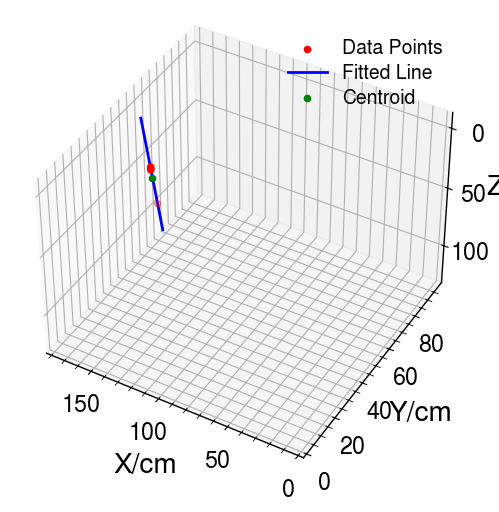

In [32]:
E17_223 = reconstruct_timed_Chi2(cross_chamber_3_rpc_events[12263],3)

ANT.non_interactive_muon_plot(E17_223[0],E17_223[1],E17_223[2])


In [33]:
ANT.interactive_muon_plot(E17_223[0],E17_223[1],E17_223[2])

: 

In [8]:
angles_eta, angles_phi, times_delta, chi2_values = extract_angles_phi_eta_timed_Chi2(cross_chamber_3_rpc_events)

Failed to reconstruct, Chi2 too large
Index= 0
Failed to reconstruct, Chi2 too large
Index= 4
Failed to reconstruct, not enough coords
Index= 7
Failed to reconstruct, Chi2 too large
Index= 9
Failed to reconstruct, not enough coords
Index= 20
Failed to reconstruct, Chi2 too large
Index= 24
Failed to reconstruct, not enough coords
Index= 30
Failed to reconstruct, Chi2 too large
Index= 33
Failed to reconstruct, not enough coords
Index= 35
Failed to reconstruct, not enough coords
Index= 39
Failed to reconstruct, not enough coords
Index= 42
Failed to reconstruct, Chi2 too large
Index= 44
Failed to reconstruct, not enough coords
Index= 52
Failed to reconstruct, not enough coords
Index= 53
Failed to reconstruct, not enough coords
Index= 56
Failed to reconstruct, Chi2 too large
Index= 59
Failed to reconstruct, Chi2 too large
Index= 61
Failed to reconstruct, not enough coords
Index= 63
Failed to reconstruct, not enough coords
Index= 64
Failed to reconstruct, Chi2 too large
Index= 72
Failed to r

C:\Users\patri\AppData\Local\Temp\ipykernel_20304\1997729958.py:127: RuntimeWarning: divide by zero encountered in scalar divide
  t = (z-z_0)/d[2]
C:\Users\patri\AppData\Local\Temp\ipykernel_20304\1997729958.py:132: RuntimeWarning: invalid value encountered in scalar multiply
  y_traj = centroid[1] + t*d[1]
C:\Users\patri\AppData\Local\Temp\ipykernel_20304\1997729958.py:127: RuntimeWarning: invalid value encountered in scalar divide
  t = (z-z_0)/d[2]


Failed to reconstruct, not enough coords
Index= 1573
Failed to reconstruct, Chi2 too large
Index= 1575
Failed to reconstruct, not enough coords
Index= 1578
Failed to reconstruct, Chi2 too large
Index= 1579
Failed to reconstruct, Chi2 too large
Index= 1582
Failed to reconstruct, not enough coords
Index= 1599
Failed to reconstruct, not enough coords
Index= 1614
Failed to reconstruct, not enough coords
Index= 1615
Failed to reconstruct, Chi2 too large
Index= 1627
Failed to reconstruct, Chi2 too large
Index= 1630
Failed to reconstruct, not enough coords
Index= 1633
Failed to reconstruct, not enough coords
Index= 1639
Failed to reconstruct, Chi2 too large
Index= 1646
Failed to reconstruct, Chi2 too large
Index= 1648
Failed to reconstruct, not enough coords
Index= 1649
Failed to reconstruct, not enough coords
Index= 1652
Failed to reconstruct, not enough coords
Index= 1656
Failed to reconstruct, not enough coords
Index= 1657
Failed to reconstruct, Chi2 too large
Index= 1658
Failed to reconst

C:\Users\patri\AppData\Local\Temp\ipykernel_20304\1997729958.py:131: RuntimeWarning: invalid value encountered in scalar multiply
  x_traj = centroid[0] + t*d[0]


Failed to reconstruct, not enough coords
Index= 13033
Failed to reconstruct, not enough coords
Index= 13036
Failed to reconstruct, not enough coords
Index= 13039
Failed to reconstruct, not enough coords
Index= 13045
Failed to reconstruct, Chi2 too large
Index= 13053
Failed to reconstruct, not enough coords
Index= 13069
Failed to reconstruct, not enough coords
Index= 13075
Failed to reconstruct, not enough coords
Index= 13078
Failed to reconstruct, not enough coords
Index= 13082
Failed to reconstruct, not enough coords
Index= 13084
Failed to reconstruct, Chi2 too large
Index= 13101
Failed to reconstruct, not enough coords
Index= 13102
Failed to reconstruct, Chi2 too large
Index= 13105
Failed to reconstruct, Chi2 too large
Index= 13108
Failed to reconstruct, not enough coords
Index= 13119
Failed to reconstruct, not enough coords
Index= 13126
Failed to reconstruct, not enough coords
Index= 13129
Failed to reconstruct, not enough coords
Index= 13134
Failed to reconstruct, not enough coords

In [9]:
def plot_angle_distribution_absolute(angles, title, label):
    #Plot angular distribution given phi and eta angular distribution separately.
    #Plot absolute number of counts rather than relative occurence.

    plt.figure(figsize=(16,10))

    angles_degrees = [x*(180/np.pi) for x in angles]
    bin_edges = np.arange(-90.5, 91.5, 1)

    # Plot histogram with counts
    plt.hist(angles_degrees, bins=bin_edges, density=False,edgecolor='black',alpha=0.7, label=f"{label}")
    
    plt.annotate(f"Number of events = {len(angles)}",(0.2,0.6),xycoords='figure fraction')

    plt.xlim(-90,90)

    # Customize the plot
    plt.xlabel('Angle/ degrees from axis perpendicular to surface of RPCs')
    plt.ylabel('Number of Counts')
    plt.title(title)
    plt.legend()
    plt.show()

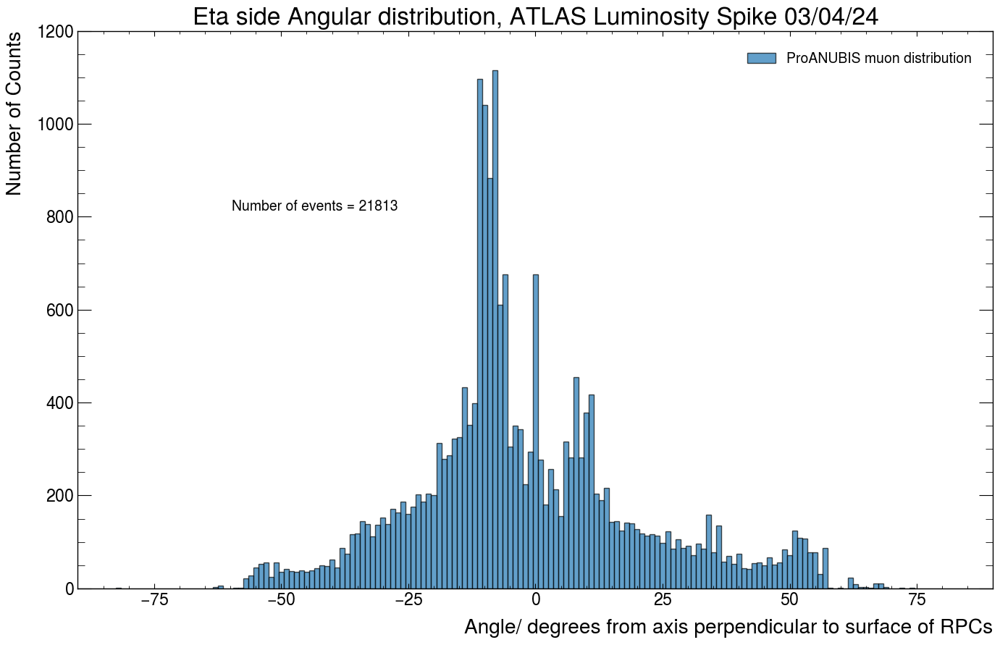

In [134]:
plot_angle_distribution_absolute(angles_eta,"Eta side Angular distribution, ATLAS Luminosity Spike 03/04/24")

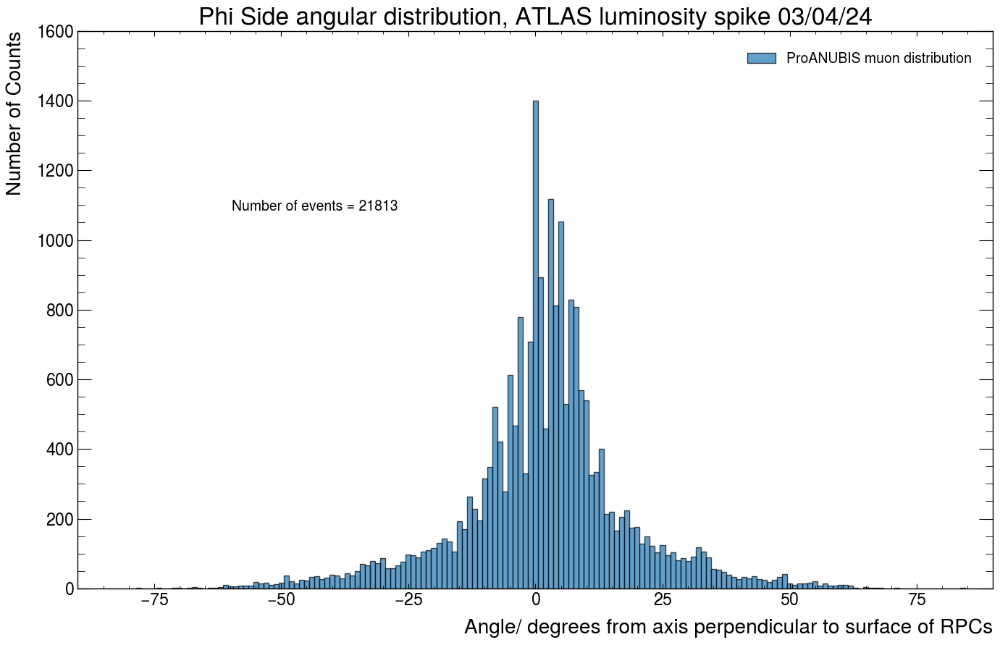

In [98]:
plot_angle_distribution_absolute(angles_phi,"Phi Side angular distribution, ATLAS luminosity spike 03/04/24")

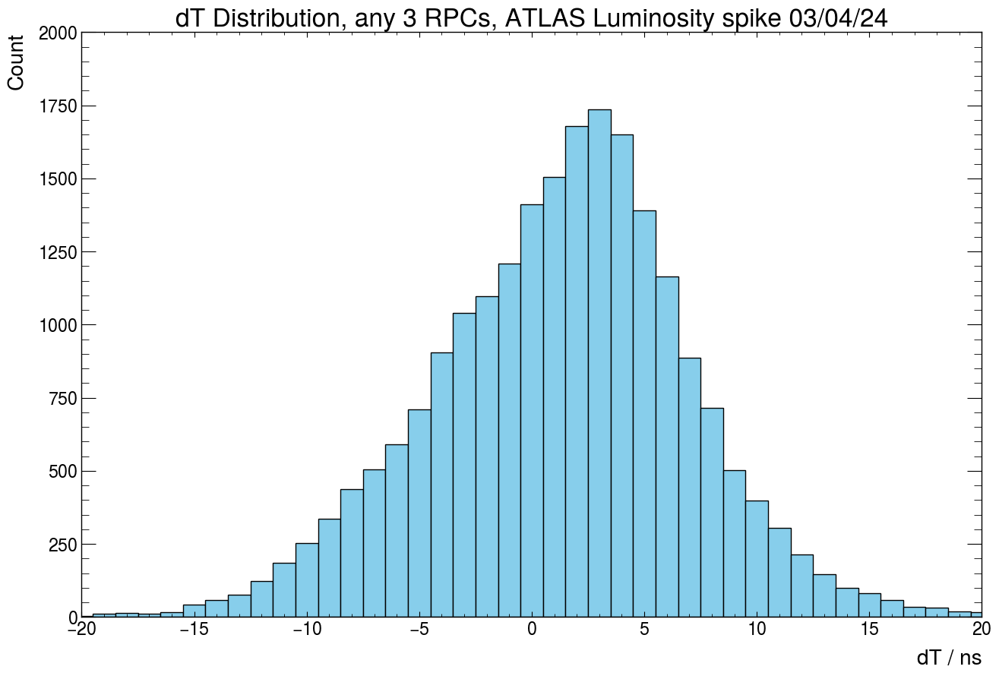

In [100]:
times_delta_filtered = [x for x in times_delta if abs(x) <=20]

# Define bin edges centered on integers between -20 and +20
bin_edges = np.arange(-20.5, 21.5, 1)

plt.figure(figsize=(15,10))

# Plotting histogram
plt.hist(times_delta_filtered, bins=bin_edges, color='skyblue', edgecolor='black')
plt.xlim(-20,20)

# Adding labels and title
plt.xlabel('dT / ns')
plt.ylabel('Count')
plt.title('dT Distribution, any 3 RPCs, ATLAS Luminosity spike 03/04/24')

# Displaying the plot
plt.show()


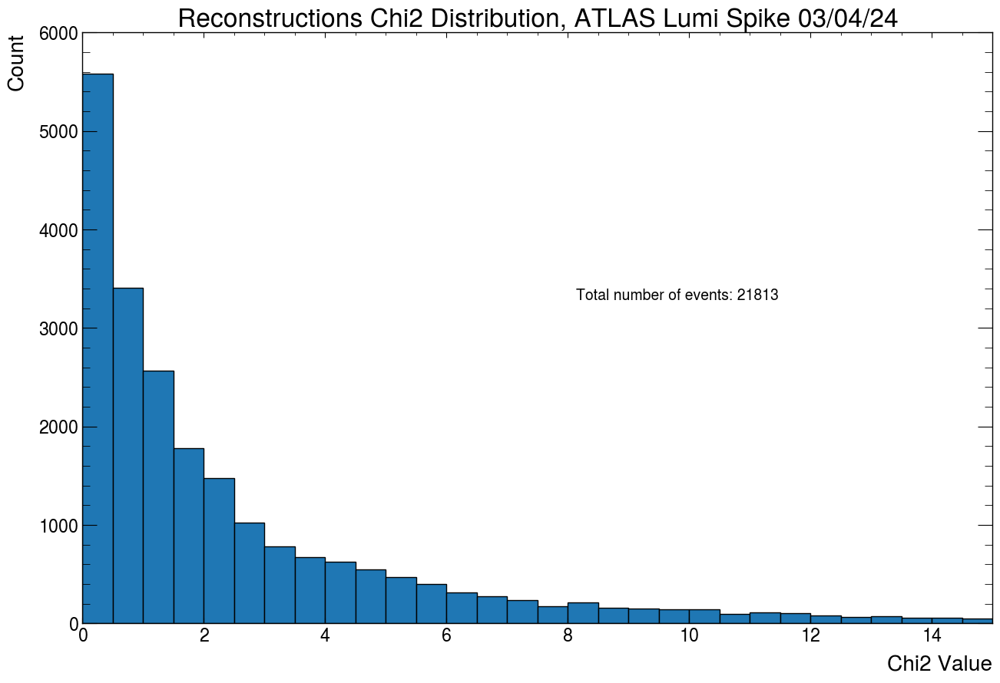

In [126]:
plt.figure(figsize=(15,10))

# Define bin edges centered on integers between -20 and +20
bin_edges = np.arange(0, 16.5, 0.5)

plt.hist(chi2_values,edgecolor='black',bins =bin_edges)

plt.xlabel("Chi2 Value")
plt.ylabel("Count")

plt.annotate(f"Total number of events: {len(chi2_values)}",(0.5,0.5),xycoords='figure fraction')

plt.xlim(0,15)

plt.title("Reconstructions Chi2 Distribution, ATLAS Lumi Spike 03/04/24")

plt.show()

In [128]:
angles_eta_degrees = [x*180/np.pi for x in angles_eta]
# Create the 2D histogram with logarithm of counts
hist, x_edges, y_edges = np.histogram2d(angles_eta_degrees, times_delta, bins=(81, 61))
hist_log = np.log10(hist + 1)  # Adding 1 to avoid taking log of zero

fig = go.Figure(go.Heatmap(
    z=hist_log.T,
    x=x_edges,
    y=y_edges,
    colorscale='Viridis',  # Choose a colourscale
    colorbar=dict(
        title='Log10 Counts'  # Label for colour bar
    ),
))

# Update layout to set axis ticks
fig.update_layout(
    xaxis=dict(
        title='Eta Angle/ °',  # Set x-axis title
        tickmode='linear',    # Set tick mode to linear
        tick0=0,              # Start tick at 0
        dtick=5,              # Set tick interval to 5 degrees
        range=[-90, 90],
        showgrid=True,        # Show gridlines
        gridcolor='lightgray',  # Set gridline colour
        gridwidth=1,          # Set gridline width
    ),
    yaxis=dict(
        title='dT / ns',      # Set y-axis title
        tickmode='linear',    # Set tick mode to linear
        tick0=0,              # Start tick at 0
        dtick=5,              # Set tick interval to 5 ns
        range=[-30, 30],
        showgrid=True,        # Show gridlines
        gridcolor='lightgray',  # Set gridline color
        gridwidth=1,          # Set gridline width
    ),
    width=1000,               # Set the width of the figure in pixels
    height=600,               # Set the height of the figure in pixels
    title='Variation of dT with eta angle, 2D histogram with Log of Counts, ATLAS Lumi Spike 03/04/24',
)

fig.show()


In [129]:
import plotly.graph_objects as go

angles_phi_degrees = [x*180/np.pi for x in angles_phi]

import plotly.graph_objects as go

# Create the 2D histogram with logarithm of counts
hist, x_edges, y_edges = np.histogram2d(angles_phi_degrees, times_delta, bins=(81, 61))
hist_log = np.log10(hist + 1)  # Adding 1 to avoid taking log of zero

fig = go.Figure(go.Heatmap(
    z=hist_log.T,
    x=x_edges,
    y=y_edges,
    colorscale='Viridis',  # Choose a colorscale
    colorbar=dict(
        title='Log10 Counts'  # Label for color bar
    ),
))

# Update layout to set axis ticks
fig.update_layout(
    xaxis=dict(
        title='Phi Angle/ °',  # Set x-axis title
        tickmode='linear',    # Set tick mode to linear
        tick0=0,              # Start tick at 0
        dtick=5,              # Set tick interval to 5 degrees
        range=[-90, 90],
        showgrid=True,        # Show gridlines
        gridcolor='lightgray',  # Set gridline color
        gridwidth=1,          # Set gridline width
    ),
    yaxis=dict(
        title='dT / ns',      # Set y-axis title
        tickmode='linear',    # Set tick mode to linear
        tick0=0,              # Start tick at 0
        dtick=5,              # Set tick interval to 5 ns
        range=[-30, 30],
        showgrid=True,        # Show gridlines
        gridcolor='lightgray',  # Set gridline color
        gridwidth=1,          # Set gridline width
    ),
    width=1000,               # Set the width of the figure in pixels
    height=600,               # Set the height of the figure in pixels
    title='Variation of dT with phi angle, 2D histogram with Log of Counts, ATLAS Lumi Spike 03/04/24',
)

fig.show()


Cosmics Data 

In [10]:
Cosmics = ANT.importFromHDF5File(current_directory+"\\ProAnubisData\\ATLAS LUMINOSITY\\proAnubis_240403_1427_cosmics.h5")

data_cosmics = [sublist[:55489] for sublist in Cosmics]

c_etaHits, c_phiHits = ANT.divideHitCountsByRPC_Timed(data_cosmics)

#Time_window for coincidence set at 15 ns.
#Temporal Clustering
coincident_hits_cosmics = ANT.FindCoincidentHits(c_etaHits,c_phiHits,15)

#Spatial Clustering
coincident_hits_cosmics_clustered = ANT.cluster(coincident_hits_cosmics)

print(len(coincident_hits_cosmics_clustered))

0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
0%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1%
1

In [11]:
#Filter events depending on what you would like to look at.
#filter_events(data,minimum number of chambers hit, minimum number of RPCs hit)
cross_chamber_3_rpc_events_cosmics = ANT.filter_events(coincident_hits_cosmics_clustered,2,3)
print("......")
all_6_rpcs_cosmics = ANT.filter_events(coincident_hits_cosmics_clustered,3,6)

Number of events in filter = 9390
......
Number of events in filter = 424


In [12]:
angles_eta_cosmics, angles_phi_cosmics, times_delta_cosmics, chi2_values_cosmics = extract_angles_phi_eta_timed_Chi2(cross_chamber_3_rpc_events_cosmics)

Failed to reconstruct, Chi2 too large
Index= 3
Failed to reconstruct, not enough coords
Index= 14
Failed to reconstruct, not enough coords
Index= 20
Failed to reconstruct, not enough coords
Index= 28
Failed to reconstruct, not enough coords
Index= 29
Failed to reconstruct, Chi2 too large
Index= 40
Failed to reconstruct, not enough coords
Index= 42
Failed to reconstruct, Chi2 too large
Index= 43
Failed to reconstruct, not enough coords
Index= 48
Failed to reconstruct, Chi2 too large
Index= 55
Failed to reconstruct, not enough coords
Index= 56
Failed to reconstruct, not enough coords
Index= 57
Failed to reconstruct, Chi2 too large
Index= 60
Failed to reconstruct, not enough coords
Index= 61
Failed to reconstruct, not enough coords
Index= 73
Failed to reconstruct, not enough coords
Index= 74
Failed to reconstruct, not enough coords
Index= 75
Failed to reconstruct, not enough coords
Index= 76
Failed to reconstruct, not enough coords
Index= 81
Failed to reconstruct, not enough coords
Index=

C:\Users\patri\AppData\Local\Temp\ipykernel_20304\1997729958.py:127: RuntimeWarning: divide by zero encountered in scalar divide
  t = (z-z_0)/d[2]
C:\Users\patri\AppData\Local\Temp\ipykernel_20304\1997729958.py:132: RuntimeWarning: invalid value encountered in scalar multiply
  y_traj = centroid[1] + t*d[1]
C:\Users\patri\AppData\Local\Temp\ipykernel_20304\1997729958.py:127: RuntimeWarning: invalid value encountered in scalar divide
  t = (z-z_0)/d[2]


Failed to reconstruct, Chi2 too large
Index= 330
Failed to reconstruct, not enough coords
Index= 336
Failed to reconstruct, not enough coords
Index= 344
Failed to reconstruct, not enough coords
Index= 349
Failed to reconstruct, not enough coords
Index= 351
Failed to reconstruct, not enough coords
Index= 354
Failed to reconstruct, not enough coords
Index= 356
Failed to reconstruct, not enough coords
Index= 362
Failed to reconstruct, not enough coords
Index= 366
Failed to reconstruct, Chi2 too large
Index= 367
Failed to reconstruct, Chi2 too large
Index= 369
Failed to reconstruct, not enough coords
Index= 375
Failed to reconstruct, not enough coords
Index= 378
Failed to reconstruct, Chi2 too large
Index= 379
Failed to reconstruct, not enough coords
Index= 385
Failed to reconstruct, not enough coords
Index= 387
Failed to reconstruct, Chi2 too large
Index= 389
Failed to reconstruct, Chi2 too large
Index= 391
Failed to reconstruct, not enough coords
Index= 398
Failed to reconstruct, not eno

C:\Users\patri\AppData\Local\Temp\ipykernel_20304\1997729958.py:131: RuntimeWarning: invalid value encountered in scalar multiply
  x_traj = centroid[0] + t*d[0]


Failed to reconstruct, Chi2 too large
Index= 1370
Failed to reconstruct, not enough coords
Index= 1372
Failed to reconstruct, not enough coords
Index= 1379
Failed to reconstruct, not enough coords
Index= 1380
Failed to reconstruct, not enough coords
Index= 1381
Failed to reconstruct, not enough coords
Index= 1385
Failed to reconstruct, not enough coords
Index= 1402
Failed to reconstruct, not enough coords
Index= 1403
Failed to reconstruct, Chi2 too large
Index= 1404
Failed to reconstruct, Chi2 too large
Index= 1412
Failed to reconstruct, not enough coords
Index= 1414
Failed to reconstruct, Chi2 too large
Index= 1417
Failed to reconstruct, not enough coords
Index= 1421
Failed to reconstruct, not enough coords
Index= 1424
Failed to reconstruct, Chi2 too large
Index= 1425
Failed to reconstruct, not enough coords
Index= 1427
Failed to reconstruct, not enough coords
Index= 1428
Failed to reconstruct, not enough coords
Index= 1436
Failed to reconstruct, not enough coords
Index= 1443
Failed t

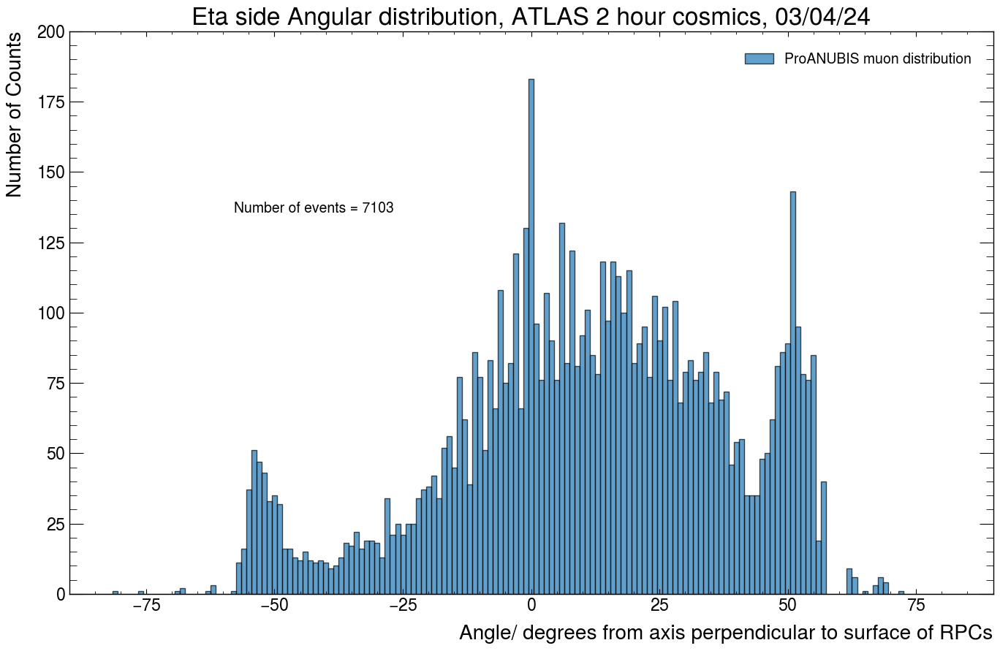

In [135]:
plot_angle_distribution_absolute(angles_eta_cosmics,"Eta side Angular distribution, ATLAS 2 hour cosmics, 03/04/24")

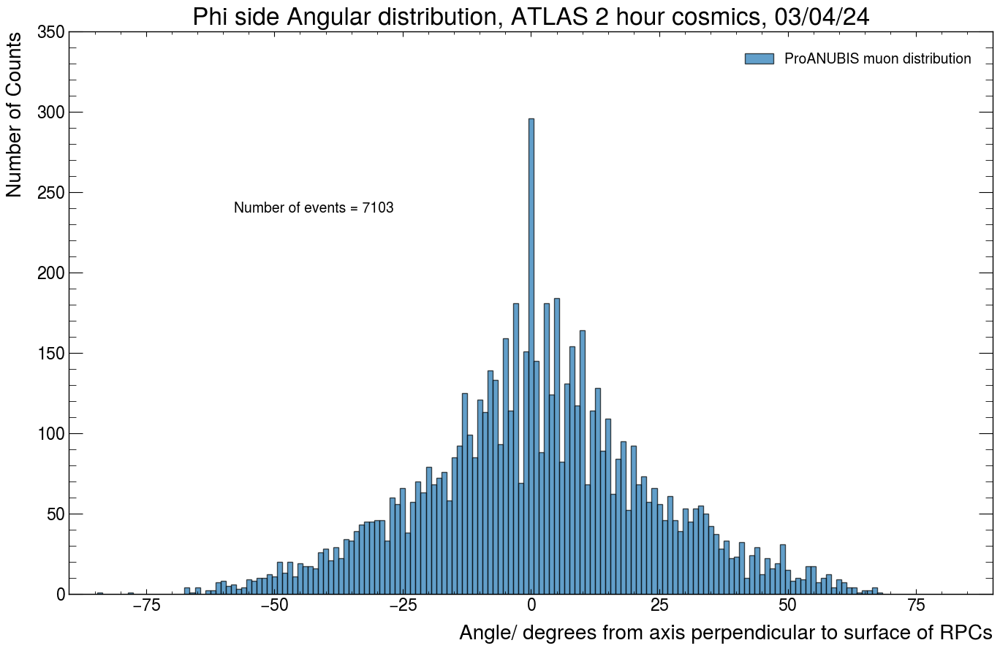

In [137]:
plot_angle_distribution_absolute(angles_phi_cosmics,"Phi side Angular distribution, ATLAS 2 hour cosmics, 03/04/24")

In [148]:
angles_eta_degrees = [x*180/np.pi for x in angles_eta_cosmics]
# Create the 2D histogram with logarithm of counts
hist, x_edges, y_edges = np.histogram2d(angles_eta_degrees, times_delta_cosmics, bins=(81, 61))
hist_log = np.log10(hist + 1)  # Adding 1 to avoid taking log of zero

fig = go.Figure(go.Heatmap(
    z=hist_log.T,
    x=x_edges,
    y=y_edges,
    colorscale='Viridis',  # Choose a colourscale
    colorbar=dict(
        title='Log10 Counts'  # Label for colour bar
    ),
))

# Update layout to set axis ticks
fig.update_layout(
    xaxis=dict(
        title='Eta Angle/ °',  # Set x-axis title
        tickmode='linear',    # Set tick mode to linear
        tick0=0,              # Start tick at 0
        dtick=5,              # Set tick interval to 5 degrees
        range=[-90, 90],
        showgrid=True,        # Show gridlines
        gridcolor='lightgray',  # Set gridline colour
        gridwidth=1,          # Set gridline width
    ),
    yaxis=dict(
        title='dT / ns',      # Set y-axis title
        tickmode='linear',    # Set tick mode to linear
        tick0=0,              # Start tick at 0
        dtick=5,              # Set tick interval to 5 ns
        range=[-30, 30],
        showgrid=True,        # Show gridlines
        gridcolor='lightgray',  # Set gridline color
        gridwidth=1,          # Set gridline width
    ),
    width=1000,               # Set the width of the figure in pixels
    height=600,               # Set the height of the figure in pixels
    title='Variation of dT with eta angle, 2D histogram with Log of Counts, ATLAS Lumi Spike 03/04/24',
)

fig.show()


In [150]:
angles_phi_degrees = [x*180/np.pi for x in angles_phi_cosmics]
# Create the 2D histogram with logarithm of counts
hist, x_edges, y_edges = np.histogram2d(angles_phi_degrees, times_delta_cosmics, bins=(81, 61))
hist_log = np.log10(hist + 1)  # Adding 1 to avoid taking log of zero

fig = go.Figure(go.Heatmap(
    z=hist_log.T,
    x=x_edges,
    y=y_edges,
    colorscale='Viridis',  # Choose a colourscale
    colorbar=dict(
        title='Log10 Counts'  # Label for colour bar
    ),
))

# Update layout to set axis ticks
fig.update_layout(
    xaxis=dict(
        title='Phi Angle/ °',  # Set x-axis title
        tickmode='linear',    # Set tick mode to linear
        tick0=0,              # Start tick at 0
        dtick=5,              # Set tick interval to 5 degrees
        range=[-90, 90],
        showgrid=True,        # Show gridlines
        gridcolor='lightgray',  # Set gridline colour
        gridwidth=1,          # Set gridline width
    ),
    yaxis=dict(
        title='dT / ns',      # Set y-axis title
        tickmode='linear',    # Set tick mode to linear
        tick0=0,              # Start tick at 0
        dtick=5,              # Set tick interval to 5 ns
        range=[-30, 30],
        showgrid=True,        # Show gridlines
        gridcolor='lightgray',  # Set gridline color
        gridwidth=1,          # Set gridline width
    ),
    width=1000,               # Set the width of the figure in pixels
    height=600,               # Set the height of the figure in pixels
    title='Variation of dT with eta angle, 2D histogram with Log of Counts, ATLAS Lumi Spike 03/04/24',
)

fig.show()


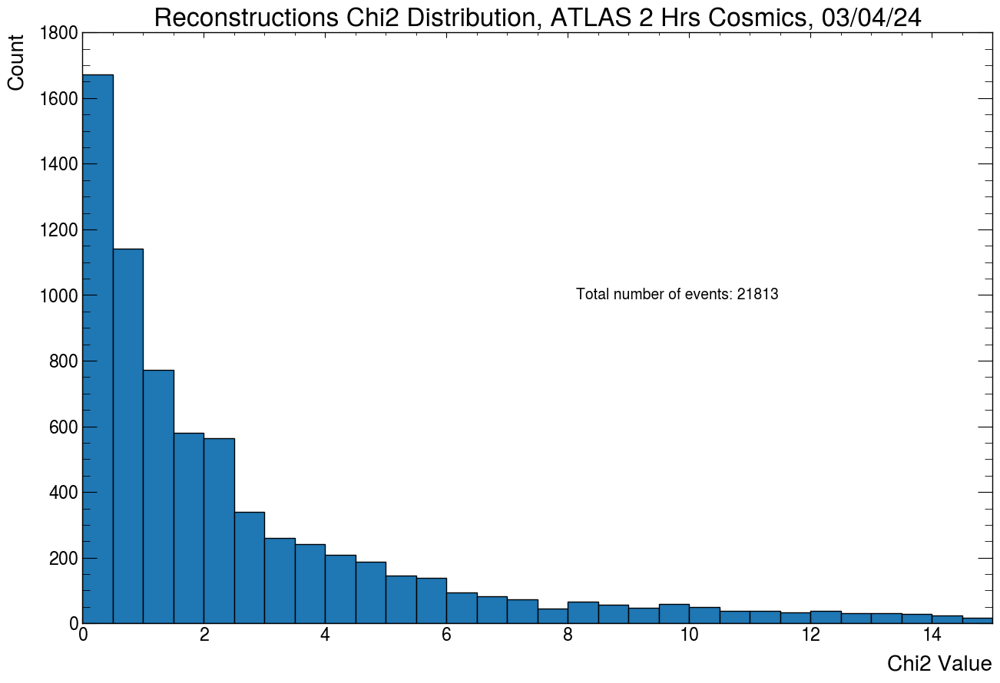

In [151]:
plt.figure(figsize=(15,10))

# Define bin edges centered on integers between -20 and +20
bin_edges = np.arange(0, 16.5, 0.5)

plt.hist(chi2_values_cosmics,edgecolor='black',bins =bin_edges)

plt.xlabel("Chi2 Value")
plt.ylabel("Count")

plt.annotate(f"Total number of events: {len(chi2_values)}",(0.5,0.5),xycoords='figure fraction')

plt.xlim(0,15)

plt.title("Reconstructions Chi2 Distribution, ATLAS 2 Hrs Cosmics, 03/04/24")

plt.show()

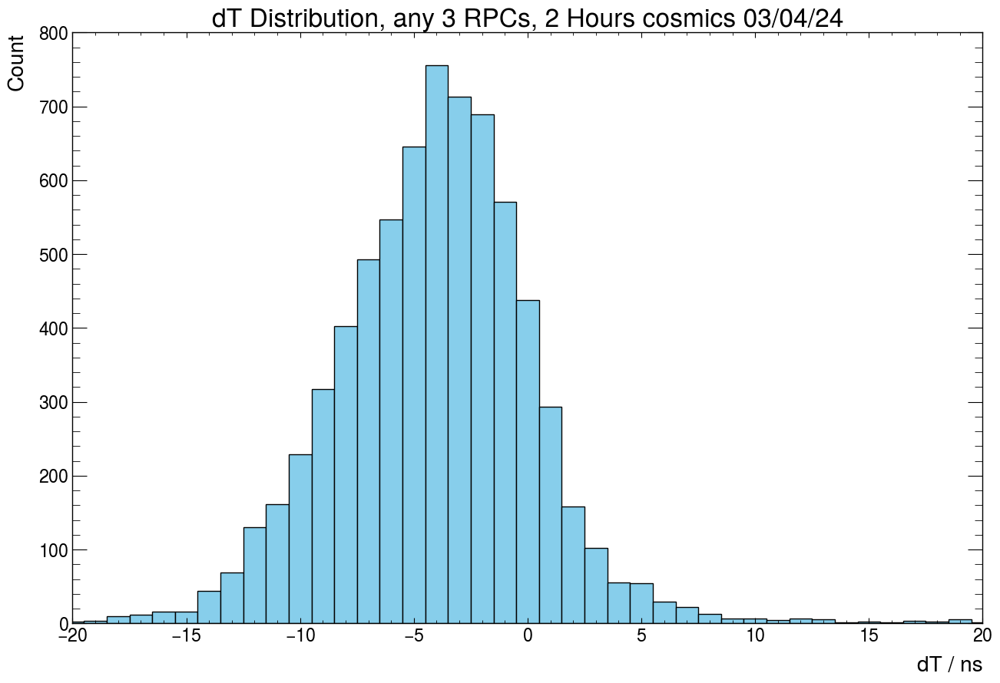

In [153]:
times_delta_filtered_cosmics = [x for x in times_delta_cosmics if abs(x) <=20]

# Define bin edges centered on integers between -20 and +20
bin_edges = np.arange(-20.5, 21.5, 1)

plt.figure(figsize=(15,10))

# Plotting histogram
plt.hist(times_delta_filtered_cosmics, bins=bin_edges, color='skyblue', edgecolor='black')
plt.xlim(-20,20)

# Adding labels and title
plt.xlabel('dT / ns')
plt.ylabel('Count')
plt.title('dT Distribution, any 3 RPCs, 2 Hours cosmics 03/04/24')

# Displaying the plot
plt.show()


In [166]:
def plot_angle_distribution_absolute_2(angles1, angles2, title):
    # Flatten the arrays if they are multidimensional
    angles1 = np.asarray(angles1).flatten()
    angles2 = np.asarray(angles2).flatten()
    
    angles1_degrees = [x*(180/np.pi) for x in angles1]
    angles2_degrees = [x*(180/np.pi) for x in angles2]
    bin_edges = np.arange(-90.5, 91.5, 5)

    plt.figure(figsize=(16, 10))


    # Plot histogram with counts
    plt.hist(angles1_degrees, bins=bin_edges,density=False, edgecolor='black',label='ATLAS Luminosity spike')

    plt.hist(angles2_degrees, bins=bin_edges, density=False, edgecolor='black', alpha=0.5, color = 'green', label='Cosmics, 2 hours')


    # Customize the plot
    plt.xlabel('Angle/ degrees from axis perpendicular to surface of RPCs')
    plt.ylabel('Number of Counts')
    plt.title(title)
    plt.legend()
    plt.grid(False)
    plt.show()

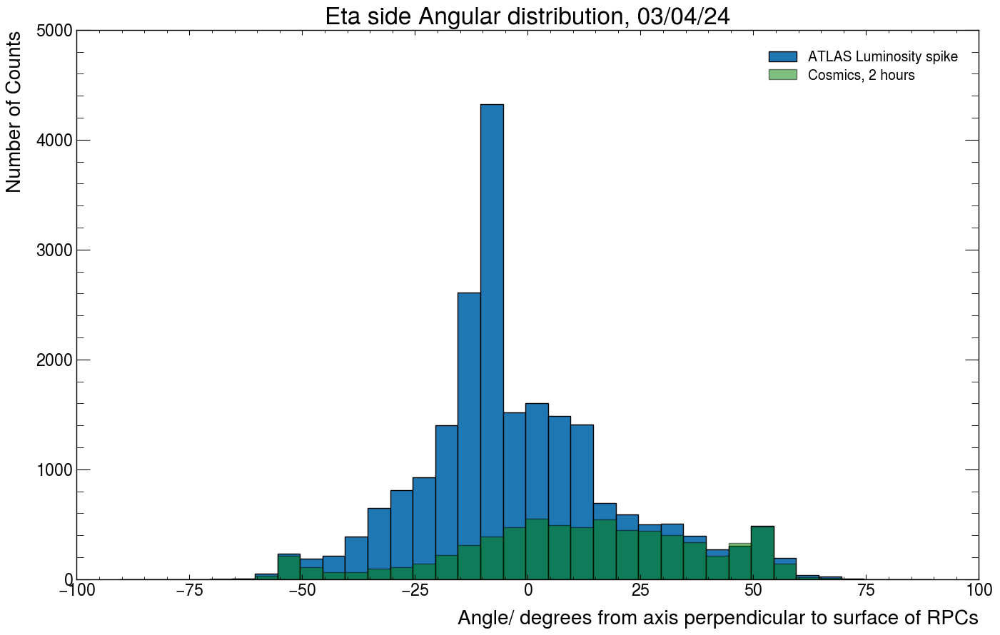

In [170]:
plot_angle_distribution_absolute_2(angles_eta,angles_eta_cosmics,"Eta side Angular distribution, 03/04/24")

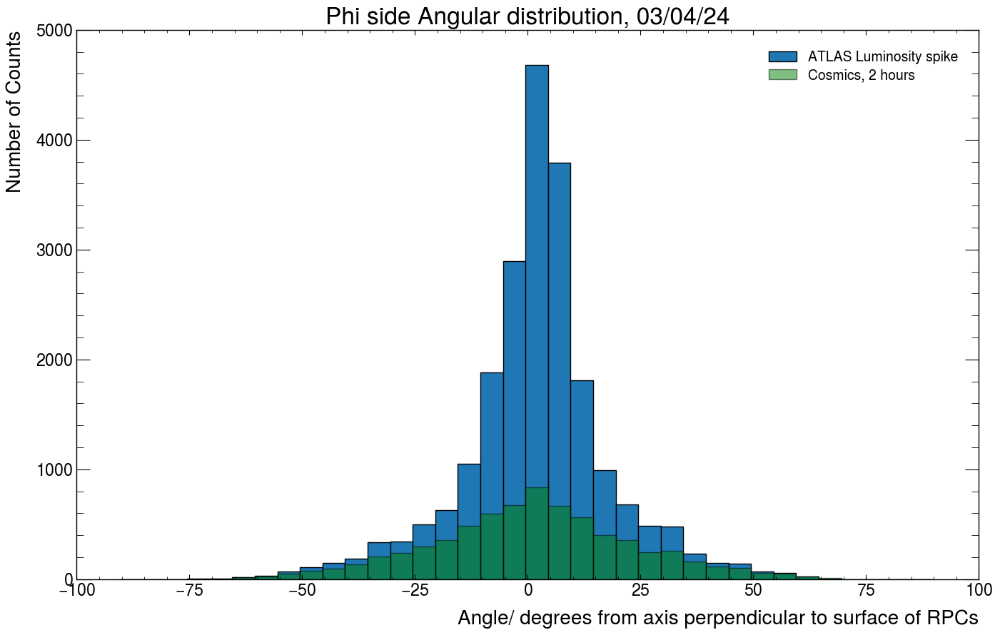

In [168]:
plot_angle_distribution_absolute_2(angles_phi,angles_phi_cosmics,"Phi side Angular distribution, 03/04/24")

dT vs dZ Distributions 

In [13]:
#Filter events depending on what you would like to look at.
#filter_events(data,minimum number of chambers hit, minimum number of RPCs hit)
cross_chamber_2_rpc_events = ANT.filter_events(coincident_hits_ATLAS_clustered,2,3)

Number of events in filter = 27227


In [31]:
def extract_DT_DZ_Chi2(coords):

    #coords = [[[x0,var,time],[y0,var],z0],[[x1,var,time],[y1,var],z1],...,[[x5,var,time],[y5,var],z5]]

    times = [[RPC,x[0][2]] for RPC, x in enumerate(coords) if isinstance(x[2], (float, int))]

    #Should already be sorted, but just in case.
    #Sort times by RPC, with RPC at lowest height at first entry.

    if len(times) > 1:

        times_sorted = sorted(times, key=lambda x: x[0])

        #print(times_sorted)

        dT = times_sorted[-1][1]-times_sorted[0][1]
        #if dT>0 this implies the particles hit the higher RPC after the lower one, so the particle is travelling upwards here.
        #Vice-versa for dT < 0 

        RPC_heights = [0.6,1.8,3.0,61.8,121.8,123] #Heights of middle point of each RPC, measured from the bottom of the Triplet Low RPC. Units are cm.

        first_RPC = times_sorted[0][0]
        last_RPC = times_sorted[-1][0]

        dZ = RPC_heights[last_RPC] - RPC_heights[first_RPC]
    
        return dT, dZ
    else:
        pass

def fit_event_chi2(coordinates_with_error):
    #Coordinates = [[[x0,var,time],[y0,var],z0],[[x1,var,time],[y1,var],z1],...,[[x5,var,time],[y5,var],z5]]
    #Z coordinate given by height of relevant RPC.
    #Using SVD

    # Calculate dT for event, in ns
    dT, dZ = extract_DT_DZ_Chi2(coordinates_with_error)
    
    coordinates = []

    for coords in coordinates_with_error:
        coordinates.append([coords[0][0],coords[1][0],coords[2]])

    centroid = np.mean(coordinates, axis=0)
    subtracted = coordinates-centroid

    # performing SVD
    _, _, V = np.linalg.svd(subtracted)
    
    # find the direction vector (which is the right singular vector corresponding to the largest singular value)
    direction = V[0, :]

    # A line is defined by the average and its direction
    p0 = centroid
    d = direction

    #Work out Chi2. Minimise this to find best fit (from possible combos)

    Chi2 = 0

    for point in coordinates_with_error:
        
        z = point[2]
        x = point[0][0]
        y = point[1][0]
        x_var = point[0][1]
        y_var = point[1][1]

        z_0 = centroid[2]

        # t = (z-z_0)/d_z

        t = (z-z_0)/d[2]

        # Find expected (x,y) coordinates at that height.

        x_traj = centroid[0] + t*d[0]
        y_traj = centroid[1] + t*d[1]

        Chi2_x = (x-x_traj)**2 / x_var
        Chi2_y = (y-y_traj)**2 / y_var

        Chi2+= Chi2_x
        Chi2+= Chi2_y

    return p0, d, Chi2, coordinates, dT, dZ

def generate_hit_coords_combo_Chi2(coords, RPC_heights, combinations=None, hit_coords=None, depth=0):

    if combinations is None:
        combinations = []
    if hit_coords is None:
        hit_coords = []

    if depth == len(coords):
        combinations.append(hit_coords.copy())
        return combinations

    x_values = coords[depth][0]
    y_values = coords[depth][1]

    if not x_values or not y_values:
        return generate_hit_coords_combo_Chi2(coords, RPC_heights, combinations, hit_coords, depth + 1)

    for x in x_values:
        for y in y_values:
            if x is not None and y is not None and isinstance(x[0], (int, float)) and isinstance(y[0], (int, float)):
                hit_coords.append([x, y, RPC_heights[depth]])
                generate_hit_coords_combo_Chi2(coords, RPC_heights, combinations, hit_coords, depth + 1)
                hit_coords.pop()

    return combinations

def reconstruct_timed_Chi2(event,max_cluster_size):

    #timed tag indicates that timing information from RPC is used to determine direction of vertical transversal of "particle" in the event.

    max_Chi2 = 15

    # event = ['Event x',TIMEBIN, [[[RPC1_PHI_CLUSTERS],[RPC1_ETA_CLUSTERS]],[[...],[...]],...]
    RPC_heights = [0.6,1.8,3.0,61.8,121.8,123] #Heights of middle point of each RPC, measured from the bottom of the Triplet Low RPC. Units are cm.

    #Extract x and y coords of cluster in event

    coords = extract_coords_timed_Chi2(event,max_cluster_size)

    # Count the number of empty RPCs
    empty_RPC_count = sum(1 for item in coords if item == [[], [],'N'])

    # If less than 3 elements of coords are occupied, exit the function
    if empty_RPC_count > 3:
        print("Failed to reconstruct, not enough coords")
        return None  # Exit the function

    #ITERATING OVER EVERY POSSIBLE COMBINATION OF x,y,z over all 3 RPCs (limited to one x,y per RPC).
    #Doesn't look particularly nice, but there are not many coordinates to loop over usually....

    combinations = generate_hit_coords_combo_Chi2(coords,RPC_heights)

    #Now for each combo in combinations, attempt to reconstruct a path. See which one gives the best trajectory.

    #If success, print parameters of fitting function.
    #If fail, print reconstruction failed.

    Chi2_current = np.inf
    optimised_coords = None
    optimised_d= None
    optimised_centroid= None
    dT = np.inf

    for ind,combo in enumerate(combinations):

        centroid, d, Chi2, coordinates, delta_T, delta_Z= fit_event_chi2(combo)
        if Chi2 < Chi2_current:

            # If new fit is better than old then replace old fit properties.
            dZ = delta_Z 
            dT = delta_T
            Chi2_current = Chi2
            optimised_centroid = centroid
            optimised_d = d
            optimised_coords = coordinates

    #if dT>0 this implies the particles hit the higher RPC after the lower one, so the particle is travelling upwards here.
    #Vice-versa for dT < 0.

    #dT = 0 case?
    
    if dT > 0:
        if optimised_d[2] < 0:
            optimised_d = np.multiply(optimised_d,-1)
    else:
        if optimised_d[2] > 0:
            optimised_d = np.multiply(optimised_d,-1)

    if Chi2_current<max_Chi2:
        return optimised_centroid, optimised_d, optimised_coords, combinations, Chi2_current, dT, dZ

    else:
        print("Failed to reconstruct, Chi2 too large")
        #return optimised_centroid, optimised_d, optimised_coords, combinations, residuals_current
        return None

In [32]:
def extract_angles_phi_eta_timed_DZ(filtered_events,min_number_RPC):

    #Input is filtered_events, output of ANT.filter_events() function

    angles_eta = []
    angles_phi = []
    delta_times = []
    dZ = []
    chi2_values = []

    for i,filtered_event in enumerate(filtered_events):

        print(f"Index= {i}") 
        
        result = reconstruct_timed_Chi2(filtered_event,3)

        if result is not None:

            delta_times.append(result[5])

            chi2_values.append(result[4])

            if abs(result[5])>40:
                print(f"Index of abnormal event= {i}")
            #Only save angles that actually were reconstructed well

            dZ.append(result[6])
            
            # a.b = |a||b|cos(x)

            #eta angle. 
            #work out the projection of the direction vector in the plane.
            
            v_parr_eta = np.array([0,result[1][1],result[1][2]])

            theta_eta = np.arccos(np.dot(v_parr_eta,[0,0,1]) / np.linalg.norm(v_parr_eta))

            if theta_eta > np.pi / 2:
                theta_eta= np.pi - theta_eta
            
            if v_parr_eta[1] > 0:
                theta_eta*=-1

            angles_eta.append(theta_eta)

            # Phi angles
            #work out the projection of the direction vector in the plane.
            
            v_parr_phi = np.array([result[1][0],0,result[1][2]])

            theta_phi = np.arccos(np.dot(v_parr_phi,[0,0,1]) / np.linalg.norm(v_parr_phi))

            if theta_phi > np.pi / 2:
                theta_phi= np.pi - theta_phi
            
            if v_parr_phi[0] < 0:
                theta_phi*=-1

            angles_phi.append(theta_phi)

    return angles_eta, angles_phi, delta_times, dZ, chi2_values

        #ProAnubis setup is at 45 degrees to vertical. 
        #Project direction vector onto planes to work out phi and eta angular distributions. Should be no assymmetry in phi.
        #Expect asymmetry in eta. 

In [33]:
angles_eta_2, angles_phi_2, times_delta_2, dZ, chi2_values_2 = extract_angles_phi_eta_timed_DZ(cross_chamber_2_rpc_events,2)

Index= 0
Failed to reconstruct, Chi2 too large
Index= 1
Index= 2
Index= 3
Index= 4
Failed to reconstruct, Chi2 too large
Index= 5
Index= 6
Index= 7
Failed to reconstruct, not enough coords
Index= 8
Index= 9
Failed to reconstruct, Chi2 too large
Index= 10
Index= 11
Index= 12
Index= 13
Index= 14
Index= 15
Index= 16
Index= 17
Index= 18
Index= 19
Index= 20
Failed to reconstruct, not enough coords
Index= 21
Index= 22
Index= 23
Index= 24
Failed to reconstruct, Chi2 too large
Index= 25
Index= 26
Index= 27
Index= 28
Index= 29
Index= 30
Failed to reconstruct, not enough coords
Index= 31
Index= 32
Index= 33
Failed to reconstruct, Chi2 too large
Index= 34
Index= 35
Failed to reconstruct, not enough coords
Index= 36
Index= 37
Index= 38
Index= 39
Failed to reconstruct, not enough coords
Index= 40
Index= 41
Index= 42
Failed to reconstruct, not enough coords
Index= 43
Index= 44
Failed to reconstruct, Chi2 too large
Index= 45
Index= 46
Index= 47
Index= 48
Index= 49
Index= 50
Index= 51
Index= 52
Failed

C:\Users\patri\AppData\Local\Temp\ipykernel_20304\2799473448.py:73: RuntimeWarning: divide by zero encountered in scalar divide
  t = (z-z_0)/d[2]
C:\Users\patri\AppData\Local\Temp\ipykernel_20304\2799473448.py:78: RuntimeWarning: invalid value encountered in scalar multiply
  y_traj = centroid[1] + t*d[1]
C:\Users\patri\AppData\Local\Temp\ipykernel_20304\2799473448.py:73: RuntimeWarning: invalid value encountered in scalar divide
  t = (z-z_0)/d[2]


Failed to reconstruct, Chi2 too large
Index= 1580
Index= 1581
Index= 1582
Failed to reconstruct, Chi2 too large
Index= 1583
Index= 1584
Index= 1585
Index= 1586
Index= 1587
Index= 1588
Index= 1589
Index= 1590
Index= 1591
Index= 1592
Index= 1593
Index= 1594
Index= 1595
Index= 1596
Index= 1597
Index= 1598
Index= 1599
Failed to reconstruct, not enough coords
Index= 1600
Index= 1601
Index= 1602
Index= 1603
Index= 1604
Index= 1605
Index= 1606
Index= 1607
Index= 1608
Index= 1609
Index= 1610
Index= 1611
Index= 1612
Index= 1613
Index= 1614
Failed to reconstruct, not enough coords
Index= 1615
Failed to reconstruct, not enough coords
Index= 1616
Index= 1617
Index= 1618
Index= 1619
Index= 1620
Index= 1621
Index= 1622
Index= 1623
Index= 1624
Index= 1625
Index= 1626
Index= 1627
Failed to reconstruct, Chi2 too large
Index= 1628
Index= 1629
Index= 1630
Failed to reconstruct, Chi2 too large
Index= 1631
Index= 1632
Index= 1633
Failed to reconstruct, not enough coords
Index= 1634
Index= 1635
Index= 1636


C:\Users\patri\AppData\Local\Temp\ipykernel_20304\2799473448.py:77: RuntimeWarning: invalid value encountered in scalar multiply
  x_traj = centroid[0] + t*d[0]


Index= 13029
Index= 13030
Index= 13031
Index= 13032
Index= 13033
Failed to reconstruct, not enough coords
Index= 13034
Index= 13035
Index= 13036
Failed to reconstruct, not enough coords
Index= 13037
Index= 13038
Index= 13039
Failed to reconstruct, not enough coords
Index= 13040
Index= 13041
Index= 13042
Index= 13043
Index= 13044
Index= 13045
Failed to reconstruct, not enough coords
Index= 13046
Index= 13047
Index= 13048
Index= 13049
Index= 13050
Index= 13051
Index= 13052
Index= 13053
Failed to reconstruct, Chi2 too large
Index= 13054
Index= 13055
Index= 13056
Index= 13057
Index= 13058
Index= 13059
Index= 13060
Index= 13061
Index= 13062
Index= 13063
Index= 13064
Index= 13065
Index= 13066
Index= 13067
Index= 13068
Index= 13069
Failed to reconstruct, not enough coords
Index= 13070
Index= 13071
Index= 13072
Index= 13073
Index= 13074
Index= 13075
Failed to reconstruct, not enough coords
Index= 13076
Index= 13077
Index= 13078
Failed to reconstruct, not enough coords
Index= 13079
Index= 13080

In [34]:
cross_chamber_2_rpc_events_cosmics = ANT.filter_events(coincident_hits_cosmics_clustered,2,3)

angles_eta_2_cosmics, angles_phi_2_cosmics, times_delta_2_cosmics, dZ_cosmics, chi2_values_2_cosmics = extract_angles_phi_eta_timed_DZ(cross_chamber_2_rpc_events_cosmics,2)

Number of events in filter = 9390
Index= 0
Index= 1
Index= 2
Index= 3
Failed to reconstruct, Chi2 too large
Index= 4
Index= 5
Index= 6
Index= 7
Index= 8
Index= 9
Index= 10
Index= 11
Index= 12
Index= 13
Index= 14
Failed to reconstruct, not enough coords
Index= 15
Index= 16
Index= 17
Index= 18
Index= 19
Index= 20
Failed to reconstruct, not enough coords
Index= 21
Index= 22
Index= 23
Index= 24
Index= 25
Index= 26
Index= 27
Index= 28
Failed to reconstruct, not enough coords
Index= 29
Failed to reconstruct, not enough coords
Index= 30
Index= 31
Index= 32
Index= 33
Index= 34
Index= 35
Index= 36
Index= 37
Index= 38
Index= 39
Index= 40
Failed to reconstruct, Chi2 too large
Index= 41
Index= 42
Failed to reconstruct, not enough coords
Index= 43
Failed to reconstruct, Chi2 too large
Index= 44
Index= 45
Index= 46
Index= 47
Index= 48
Failed to reconstruct, not enough coords
Index= 49
Index= 50
Index= 51
Index= 52
Index= 53
Index= 54
Index= 55
Failed to reconstruct, Chi2 too large
Index= 56
Failed t

C:\Users\patri\AppData\Local\Temp\ipykernel_20304\2799473448.py:73: RuntimeWarning: divide by zero encountered in scalar divide
  t = (z-z_0)/d[2]
C:\Users\patri\AppData\Local\Temp\ipykernel_20304\2799473448.py:78: RuntimeWarning: invalid value encountered in scalar multiply
  y_traj = centroid[1] + t*d[1]
C:\Users\patri\AppData\Local\Temp\ipykernel_20304\2799473448.py:73: RuntimeWarning: invalid value encountered in scalar divide
  t = (z-z_0)/d[2]


Index= 314
Index= 315
Index= 316
Index= 317
Index= 318
Index= 319
Index= 320
Index= 321
Index= 322
Index= 323
Index= 324
Index= 325
Index= 326
Index= 327
Index= 328
Index= 329
Index= 330
Failed to reconstruct, Chi2 too large
Index= 331
Index= 332
Index= 333
Index= 334
Index= 335
Index= 336
Failed to reconstruct, not enough coords
Index= 337
Index= 338
Index= 339
Index= 340
Index= 341
Index= 342
Index= 343
Index= 344
Failed to reconstruct, not enough coords
Index= 345
Index= 346
Index= 347
Index= 348
Index= 349
Failed to reconstruct, not enough coords
Index= 350
Index= 351
Failed to reconstruct, not enough coords
Index= 352
Index= 353
Index= 354
Failed to reconstruct, not enough coords
Index= 355
Index= 356
Failed to reconstruct, not enough coords
Index= 357
Index= 358
Index= 359
Index= 360
Index= 361
Index= 362
Failed to reconstruct, not enough coords
Index= 363
Index= 364
Index= 365
Index= 366
Failed to reconstruct, not enough coords
Index= 367
Failed to reconstruct, Chi2 too large
In

C:\Users\patri\AppData\Local\Temp\ipykernel_20304\2799473448.py:77: RuntimeWarning: invalid value encountered in scalar multiply
  x_traj = centroid[0] + t*d[0]


Index= 1355
Index= 1356
Failed to reconstruct, not enough coords
Index= 1357
Index= 1358
Index= 1359
Index= 1360
Index= 1361
Index= 1362
Index= 1363
Index= 1364
Index= 1365
Index= 1366
Failed to reconstruct, not enough coords
Index= 1367
Index= 1368
Index= 1369
Index= 1370
Failed to reconstruct, Chi2 too large
Index= 1371
Index= 1372
Failed to reconstruct, not enough coords
Index= 1373
Index= 1374
Index= 1375
Index= 1376
Index= 1377
Index= 1378
Index= 1379
Failed to reconstruct, not enough coords
Index= 1380
Failed to reconstruct, not enough coords
Index= 1381
Failed to reconstruct, not enough coords
Index= 1382
Index= 1383
Index= 1384
Index= 1385
Failed to reconstruct, not enough coords
Index= 1386
Index= 1387
Index= 1388
Index= 1389
Index= 1390
Index= 1391
Index= 1392
Index= 1393
Index= 1394
Index= 1395
Index= 1396
Index= 1397
Index= 1398
Index= 1399
Index= 1400
Index= 1401
Index= 1402
Failed to reconstruct, not enough coords
Index= 1403
Failed to reconstruct, not enough coords
Index

In [44]:
def plot_time_distribution_fraction_2(times1, times2, title):
    # Flatten the arrays if they are multidimensional
    times1 = np.asarray(times1).flatten()
    times2 = np.asarray(times2).flatten()

    plt.figure(figsize=(16, 10))
    
    # Define bin edges centered on integers between -20 and +20
    bin_edges = np.arange(-20.5, 21.5, 1)

    # Plot histogram with counts
    plt.hist(times1, bins=bin_edges, range=[-20,20], density=True, edgecolor='black',label='Two Chambers')
    plt.hist(times2, bins=bin_edges, range=[-20,20], density=True, edgecolor='black', alpha=0.5, color = 'green', label='Three Chambers')

    # Set x-ticks spacing to 1
    plt.xticks(np.arange(-20, 21, 2))

    plt.xlim(-20,20)

    # Customize the plot
    plt.xlabel('dT / ns')
    plt.ylabel('Fraction')
    plt.title(title)
    plt.legend()
    plt.grid(False)
    plt.show()

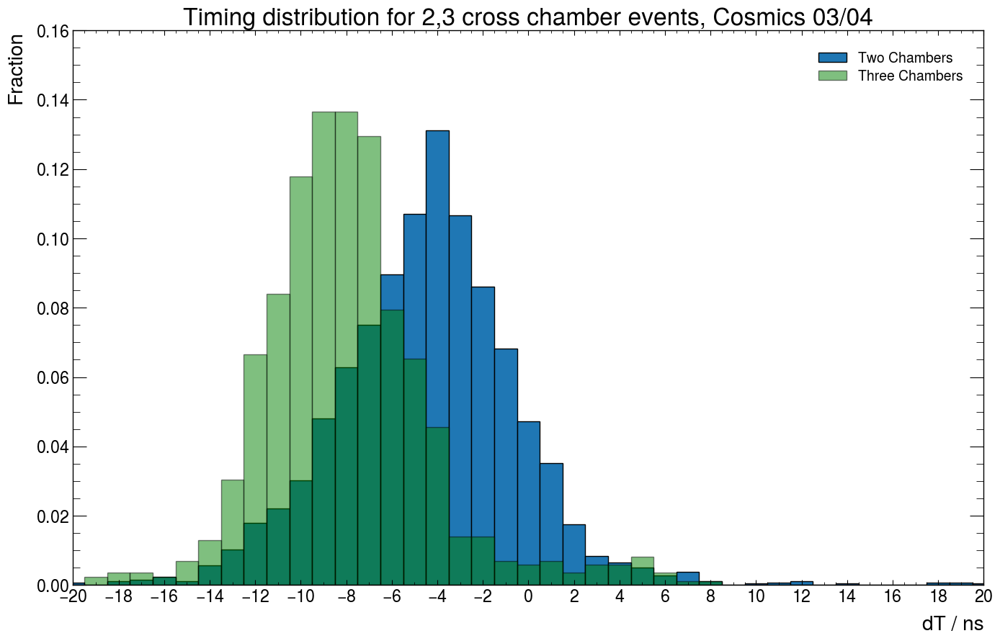

In [45]:
three_chambers = [dT for dZ, dT in zip(dZ_cosmics, times_delta_2_cosmics) if dZ > 90] 
two_chambers = [dT for dZ, dT in zip(dZ_cosmics, times_delta_2_cosmics) if 40< dZ < 80]

plot_time_distribution_fraction_2(two_chambers,three_chambers,"Timing distribution for 2,3 cross chamber events, Cosmics 03/04")

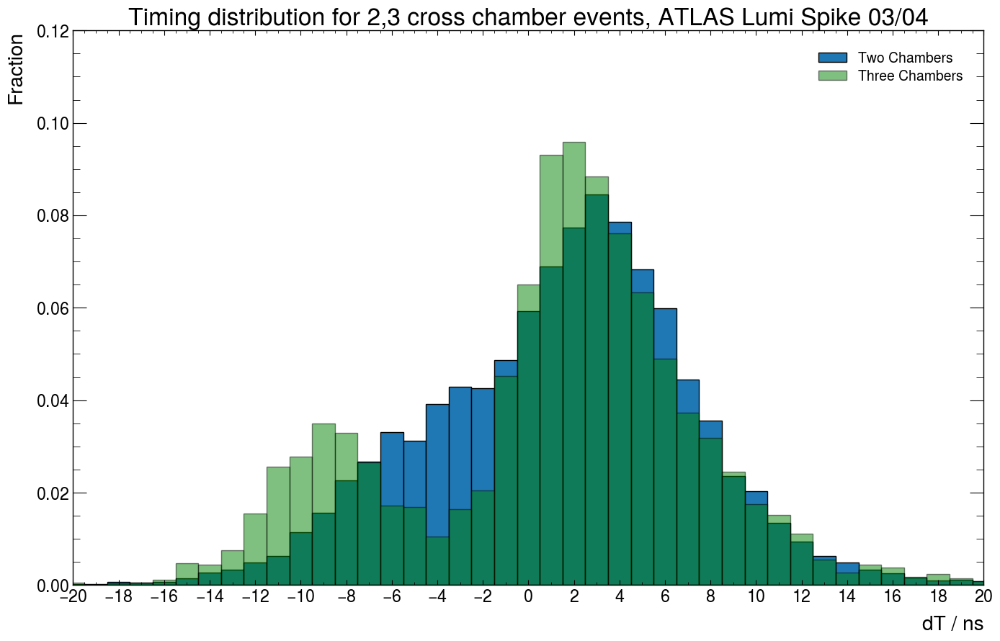

In [46]:
three_chambers = [dT for dZ, dT in zip(dZ, times_delta_2) if dZ > 90] 
two_chambers = [dT for dZ, dT in zip(dZ, times_delta_2) if 40< dZ < 80]

plot_time_distribution_fraction_2(two_chambers,three_chambers,"Timing distribution for 2,3 cross chamber events, ATLAS Lumi Spike 03/04")

In [47]:
def plot_time_distribution_absolute_2(times1, times2, title):
    # Flatten the arrays if they are multidimensional
    times1 = np.asarray(times1).flatten()
    times2 = np.asarray(times2).flatten()

    plt.figure(figsize=(16, 10))

    # Define bin edges centered on integers between -20 and +20
    bin_edges = np.arange(-20.5, 21.5, 1)

    # Plot histogram with counts
    plt.hist(times1, bins=bin_edges, range=[-20,20], density=False, edgecolor='black',label='Three Chambers, Cosmics')
    plt.hist(times2, bins=bin_edges, range=[-20,20], density=False, edgecolor='black', alpha=0.5, color = 'green', label='Three Chambers, Luminosity Spike')

    # Set x-ticks spacing to 1
    plt.xticks(np.arange(-20, 21, 2))
    plt.xlim(-20,20)

    # Customize the plot
    plt.xlabel('dT / ns')
    plt.ylabel('Count')
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

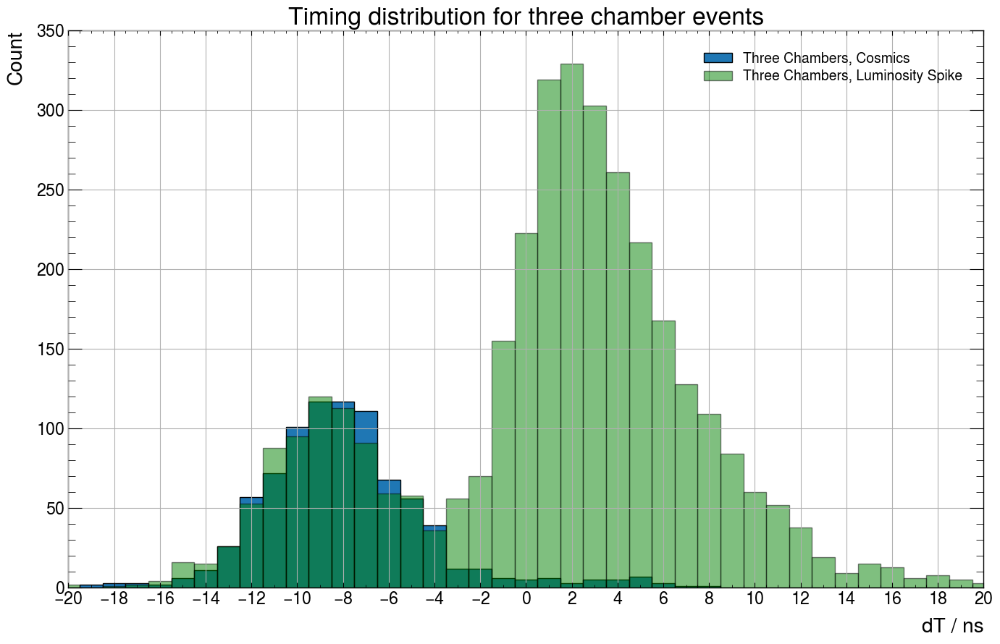

In [48]:
three_chambers = [dT for dZt, dT in zip(dZ, times_delta_2) if dZt > 90] 
three_chambers_cosmics = [dT for dZ, dT in zip(dZ_cosmics, times_delta_2_cosmics) if dZ > 90] 

plot_time_distribution_absolute_2(three_chambers_cosmics,three_chambers, "Timing distribution for three chamber events")

In [49]:
def plot_time_distribution_absolute_2(times1, times2, title):
    # Flatten the arrays if they are multidimensional
    times1 = np.asarray(times1).flatten()
    times2 = np.asarray(times2).flatten()

    plt.figure(figsize=(16, 10))

    # Define bin edges centered on integers between -20 and +20
    bin_edges = np.arange(-20.5, 21.5, 1)

    # Plot histogram with counts
    plt.hist(times1, bins=bin_edges, range=[-20,20], density=False, edgecolor='black',label='Two Chambers, Cosmics')
    plt.hist(times2, bins=bin_edges, range=[-20,20], density=False, edgecolor='black', alpha=0.5, color = 'green', label='Two Chambers, Luminosity Spike')

    # Set x-ticks spacing to 1
    plt.xticks(np.arange(-20, 21, 2))

    plt.xlim(-20,20)

    # Customize the plot
    plt.xlabel('dT / ns')
    plt.ylabel('Count')
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

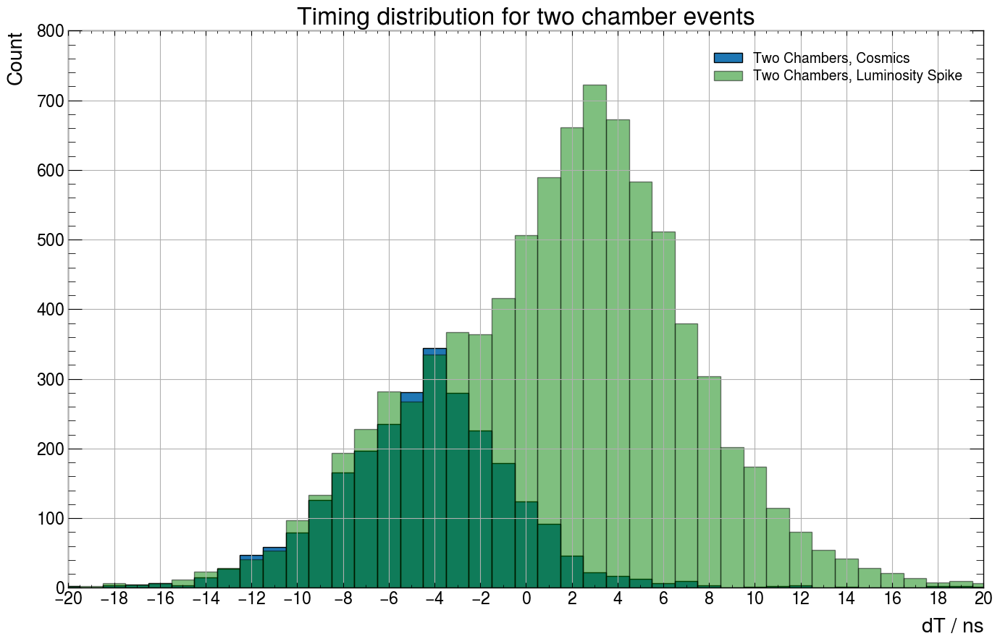

In [50]:
two_chambers = [dT for dZt, dT in zip(dZ, times_delta_2) if 40< dZt < 80] 
two_chambers_cosmics = [dT for dZt, dT in zip(dZ_cosmics, times_delta_2_cosmics) if 40< dZt < 80] 

plot_time_distribution_absolute_2(two_chambers_cosmics,two_chambers, "Timing distribution for two chamber events")

In [66]:
def plot_time_distribution_difference(times1, times2, title):
    # Flatten the arrays if they are multidimensional
    times1 = np.asarray(times1).flatten()
    times2 = np.asarray(times2).flatten()

    plt.figure(figsize=(16, 10))

    # Compute histogram counts for each dataset
    counts1, bins1, _ = plt.hist(times1, bins=41, range=[-20,20], density=False, edgecolor='black', alpha=0.0,)
    counts2, bins2, _ = plt.hist(times2, bins=41, range=[-20,20], density=False, edgecolor='black', alpha=0.0)

    # Compute the difference in counts
    counts_difference = counts2- counts1
    # Plot the histogram of the difference
    plt.bar(bins1[:-1], counts_difference, width=np.diff(bins1), align='edge', color='blue', alpha=0.5, label='ATLAS Lumi spike - cosmic background',edgecolor='black')

    # Set x-ticks spacing to 1
    plt.xticks(np.arange(-20, 21, 2))

    # Customize the plot
    plt.xlabel('dT / ns')
    plt.ylabel('Count')
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()


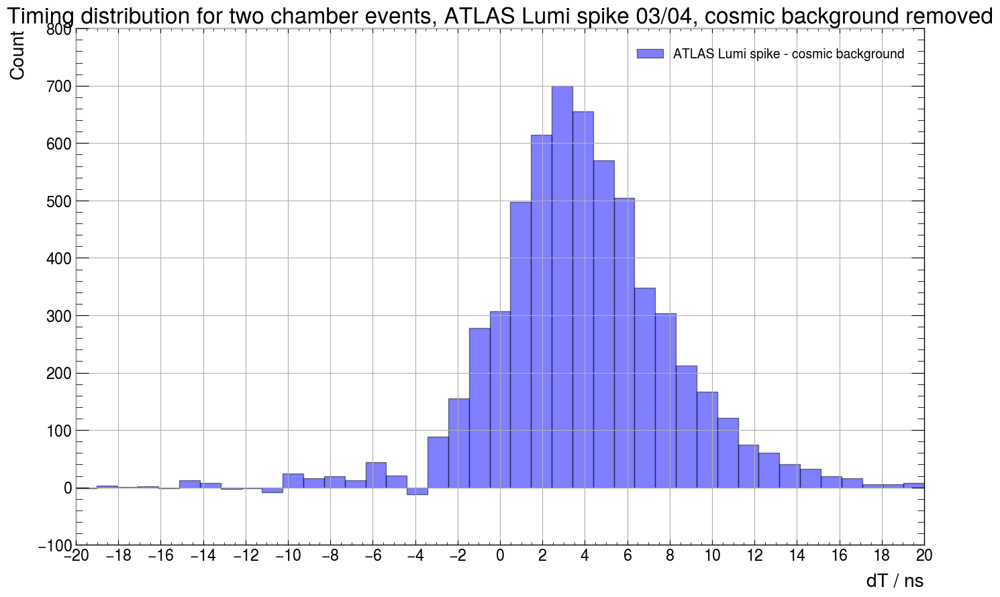

In [67]:
two_chambers = [dT for dZt, dT in zip(dZ, times_delta_2) if 40< dZt < 80] 
two_chambers_cosmics = [dT for dZt, dT in zip(dZ_cosmics, times_delta_2_cosmics) if 40< dZt < 80] 

plot_time_distribution_difference(two_chambers_cosmics,two_chambers, "Timing distribution for two chamber events, ATLAS Lumi spike 03/04, cosmic background removed")

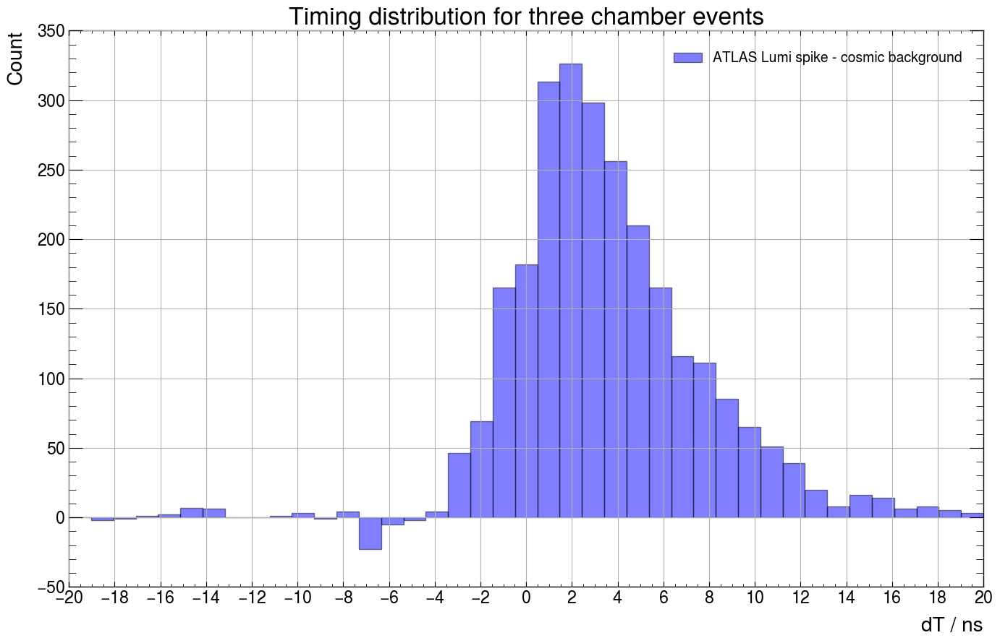

In [68]:
three_chambers = [dT for dZt, dT in zip(dZ, times_delta_2) if dZt > 90] 
three_chambers_cosmics = [dT for dZ, dT in zip(dZ_cosmics, times_delta_2_cosmics) if dZ > 90] 

plot_time_distribution_difference(three_chambers_cosmics,three_chambers, "Timing distribution for three chamber events")

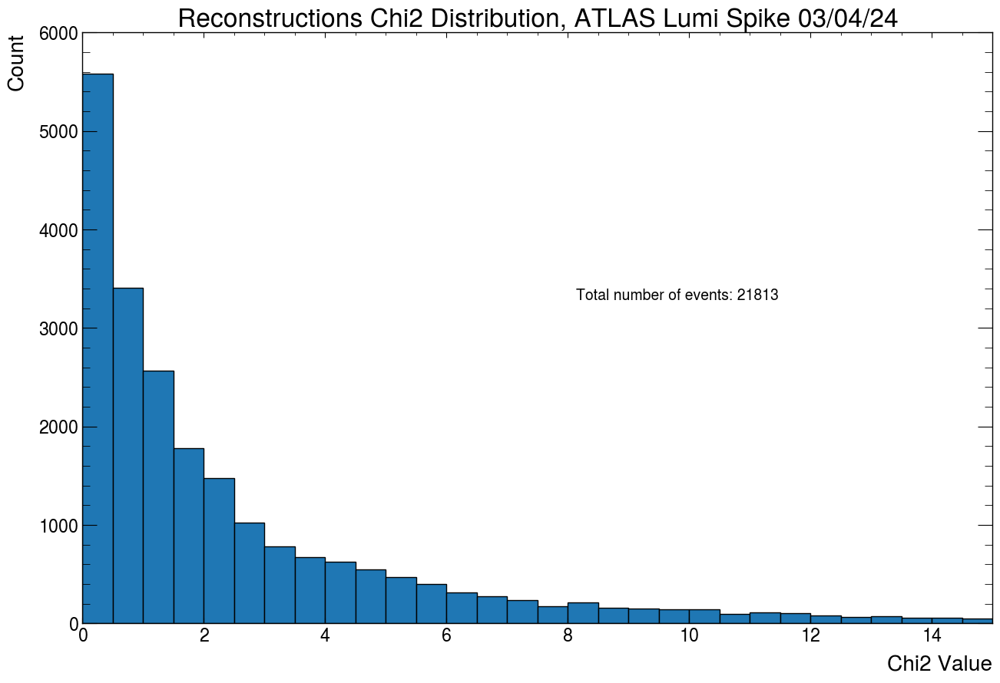

In [72]:
plt.figure(figsize=(15,10))

# Define bin edges centered on integers between -20 and +20
bin_edges = np.arange(0, 16.5, 0.5)

plt.hist(chi2_values_2,edgecolor='black',bins =bin_edges)

plt.xlabel("Chi2 Value")
plt.ylabel("Count")

plt.annotate(f"Total number of events: {len(chi2_values_2)}",(0.5,0.5),xycoords='figure fraction')

plt.xlim(0,15)

plt.title("Reconstructions Chi2 Distribution, ATLAS Lumi Spike 03/04/24")

plt.show()

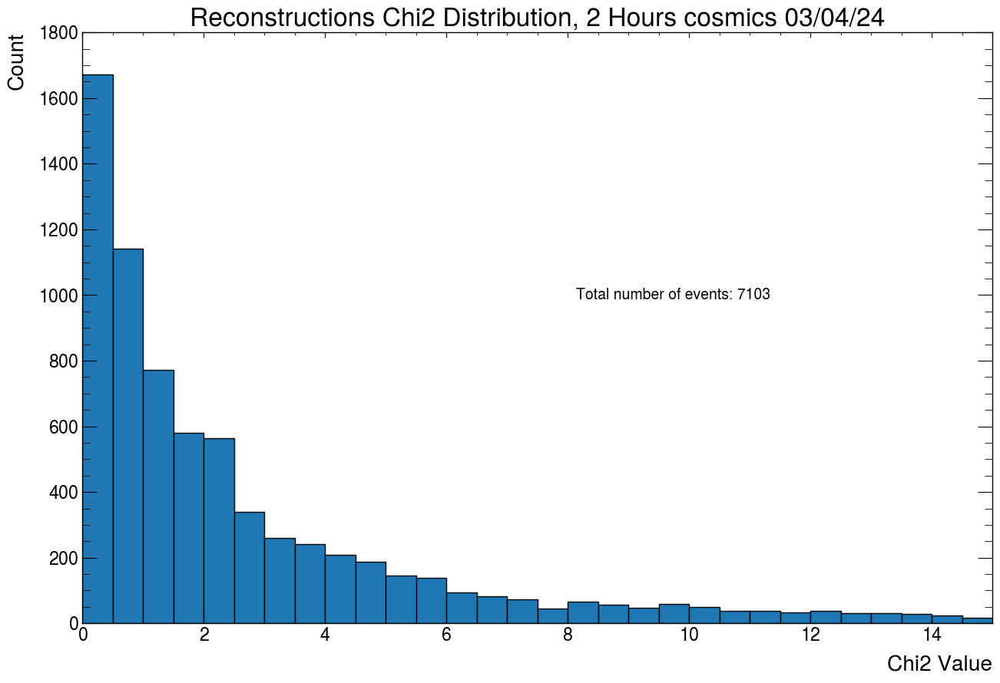

In [73]:
plt.figure(figsize=(15,10))

# Define bin edges centered on integers between -20 and +20
bin_edges = np.arange(0, 16.5, 0.5)

plt.hist(chi2_values_2_cosmics,edgecolor='black',bins =bin_edges)

plt.xlabel("Chi2 Value")
plt.ylabel("Count")

plt.annotate(f"Total number of events: {len(chi2_values_2_cosmics)}",(0.5,0.5),xycoords='figure fraction')

plt.xlim(0,15)

plt.title("Reconstructions Chi2 Distribution, 2 Hours cosmics 03/04/24")

plt.show()